# Test Splitting methods

## Loading packages and functions

In [1]:
using LinearAlgebra
using Plots

include("../../src/SplittingMethods.jl")
using .SplittingMethods  ## bertsio lokala exekutatzeko  

##### <a href="#top">Back to the top</a>

## Definition of the problem

In [2]:
PATH_ODES="../../ODEProblems/"

include(string(PATH_ODES,"InitialSchwarzschild.jl"))
include(string(PATH_ODES,"SchwarzschildBH.jl"))

flowH3Schwarzschild! (generic function with 1 method)

### Initial values

In [3]:
float_type = Float64
#float_type = BigFloat

u0, parms = InitialSchwarzschild(float_type)
u0_B=BigFloat.(u0)
parms_B=BigFloat.(parms)

Ham_Schwarzschild(u0,parms)

-0.5

## Integrations

In [4]:
function run_many_Splitting(r,s,ddt0,tspan)
    
    nruns=100
    alg=Splitting_alg(r=r)
    
    cpus=similar(ddt0)
    nflowsH3=similar(ddt0)
    retcodes=[true for k in ddt0]
    MaxΔH=[0. for i in ddt0]

    sols=Array{ODESolution}(undef,length(ddt0))
    flows=[flowH1Schwarzschild!, flowH2Schwarzschild!, flowH3Schwarzschild!]
    prob=SplittingProblem(flows, u0, tspan, parms)
    H0=Ham_Schwarzschild(u0_B,parms_B)

    for i in 1:length(ddt0)

        print(",",ddt0[i])
        dt0=ddt0[i]  

        # save_everystep=true
        m0=1
        sols[i]=solver_Splitting(prob, alg, dt=dt0, msteps=m0)
        
        if sols[i].success
           nflowsH3[i]=sols[i].stats.naccept*s           
        else
           retcodes[i]=false
           nflowsH3[i]=Inf
        end

        m0 = max(1,div(Int64(ceil((tF-t0)/ddt0[i])),1000))
        ΔH0 = map(x->Ham_Schwarzschild(BigFloat.(x),parms_B), sols[i].u)./H0.-1 
        MaxΔH[i]=maximum(abs.(ΔH0[2:end]-ΔH0[1:end-1]))
        #MaxΔH[i]=maximum(abs.(ΔH0))

        #save_everystep=false
        solx=solver_Splitting(prob, alg, dt=dt0, save_everystep=false)

        if solx.success
           cpus[i]=0.
           for k in 1:nruns
               cpus[i]+=@elapsed solver_Splitting(prob, alg, dt=dt0, save_everystep=false)
           end
           cpus[i]=cpus[i]/nruns
        else
           cpus[i]=Inf
        end


    end
    
   
    return sols, retcodes, nflowsH3, cpus, MaxΔH

    
end
    

run_many_Splitting (generic function with 1 method)

In [5]:
function plots_Splitting(title,r, ddt0,sols,nflowsH3,cpus,MaxΔH)
    
    H0=Ham_Schwarzschild(u0_B,parms_B)
    MaxΔH=[0. for i in ddt0]

    pl1=plot(ddt0,cpus, seriestype=:scatter,label="", 
             title="CPU-time", xlabel="dt", ylabel="CPU");
    pl2=plot(ddt0,nflowsH3, seriestype=:scatter, label="",
             title="nflowsH3", xlabel="dt", ylabel="nflowsH3");

    pl3=plot(title="Error in Ham r=$r",xlabel="t ", ylabel="log10(H/H0)", 
             yscale=:log10, label="")

    yrange=(1e-30,1e-1)
    for  i in 1:length(ddt0)
       ΔH0 = map(x->Ham_Schwarzschild(BigFloat.(x),parms_B), sols[i].u)./H0.-1
       MaxΔH[i]=maximum(abs.(ΔH0))
       pl3=plot!(sols[i].t[2:end],abs.(ΔH0[2:end])/ddt0[i]^r,  ylims=yrange, labels="")
    end

    fig=plot(pl1,pl2,pl3, layout=(1,3), size=(950,300), plot_title=title, plot_titlevspan=0.2)
    
    return fig
    
end

plots_Splitting (generic function with 1 method)

,2.0,2.5,3.0,3.5,4.0,4.5,5.0

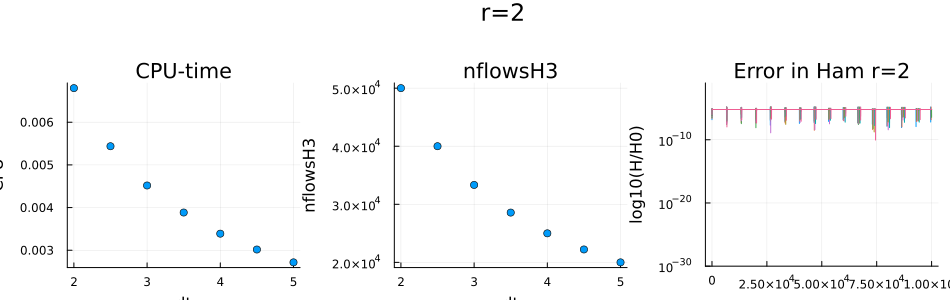

In [6]:
ddt0=collect(2:0.5:5)
t0=0.
tF=1e5  #1e7
tspan=(t0,tF)

s=1; r=2
sols_r2, retcodes_r2, nflowsH3_r2, cpus_r2, MaxΔH_r2=run_many_Splitting(r,s, ddt0, tspan)
fig=plots_Splitting("r=2",r, ddt0,sols_r2,nflowsH3_r2,cpus_r2,MaxΔH_r2)


,10.0,12.5,15.0,17.5,20.0,22.5,25.0

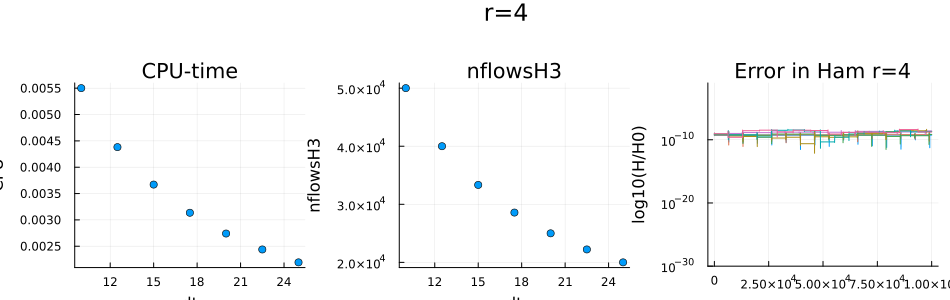

In [7]:
s=5; r=4
sols_r4, retcodes_r4, nflowsH3_r4, cpus_r4, MaxΔH_r4=run_many_Splitting(r,s, s*ddt0, tspan)
fig=plots_Splitting("r=4",r, s*ddt0,sols_r4,nflowsH3_r4,cpus_r4,MaxΔH_r4)

,26.0,32.5,39.0,45.5,52.0,58.5,65.0

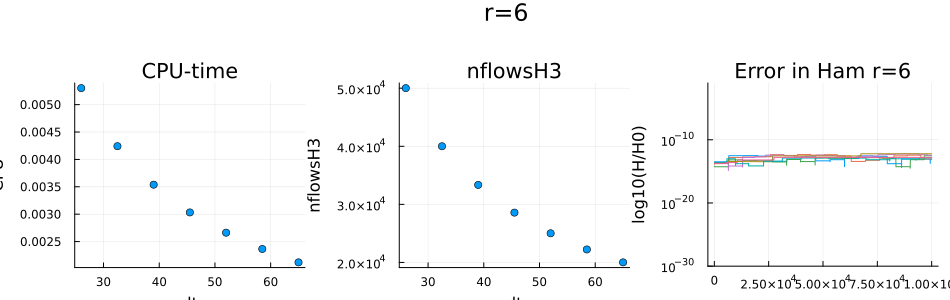

In [8]:
s=13; r=6
sols_r6, retcodes_r6, nflowsH3_r6, cpus_r6, MaxΔH_r6=run_many_Splitting(r,s, s*ddt0, tspan)
fig=plots_Splitting("r=6",r, s*ddt0,sols_r6,nflowsH3_r6,cpus_r6,MaxΔH_r6)

,42.0,52.5,63.0,73.5,84.0,94.5,105.0

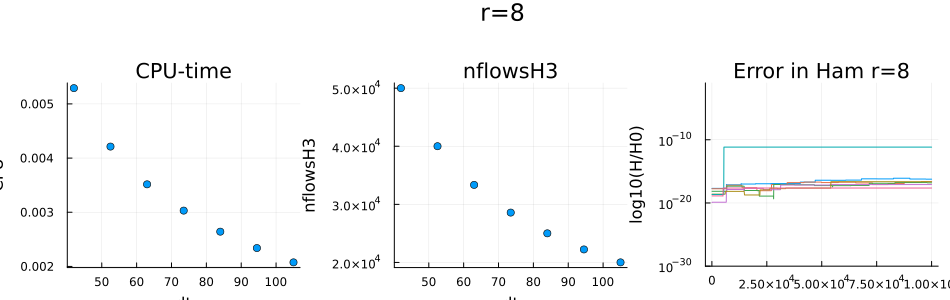

In [9]:
s=21; r=8
sols_r8, retcodes_r8, nflowsH3_r8, cpus_r8, MaxΔH_r8=run_many_Splitting(r,s, s*ddt0, tspan)
fig=plots_Splitting("r=8",r, s*ddt0,sols_r8,nflowsH3_r8,cpus_r8,MaxΔH_r8)

,70.0,87.5,105.0,122.5,140.0,157.5,175.0

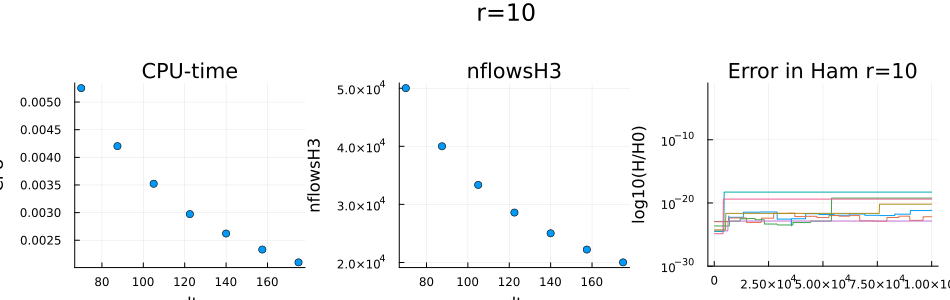

In [10]:
s=35; r=10
sols_r10, retcodes_r10, nflowsH3_r10, cpus_r10, MaxΔH_r10=run_many_Splitting(r,s, s*ddt0, tspan)
fig=plots_Splitting("r=10",r, s*ddt0,sols_r10,nflowsH3_r10,cpus_r10,MaxΔH_r10)